In [42]:
%matplotlib inline

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pylab

from skimage.feature import peak_local_max
from skimage.morphology import watershed
from scipy import ndimage

pylab.rcParams['figure.figsize'] = (10.0, 8.0)

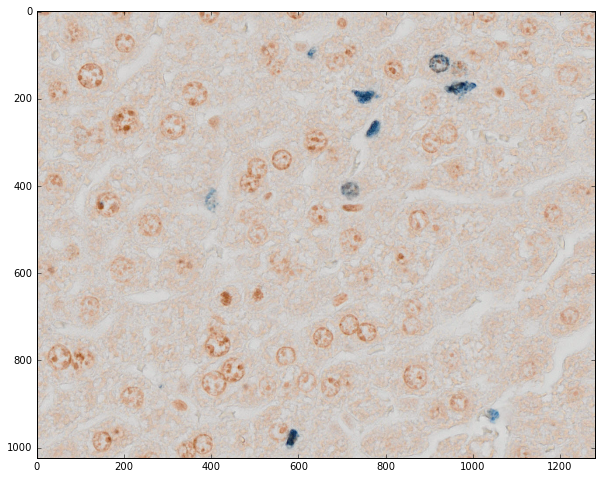

(<matplotlib.image.AxesImage at 0x17789b3d780>, None)

In [44]:
# Import image and create grayscale version in case
img = cv2.imread("Image4.tif")
#img = img[900:1024, 300:500]
plt.imshow(img), plt.show()

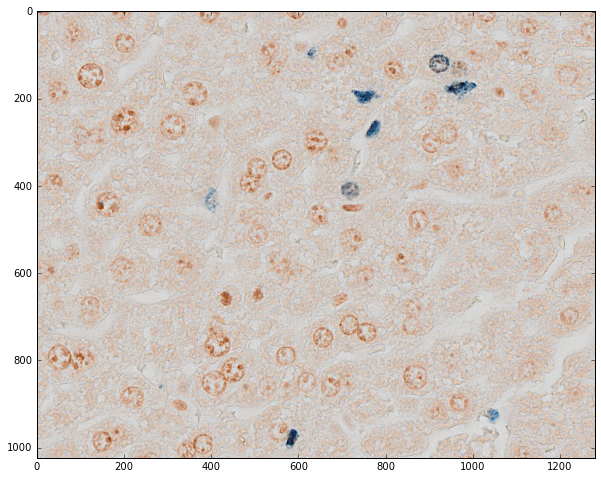

(<matplotlib.image.AxesImage at 0x17782ec6470>, None)

In [45]:
#Unsharp Masking
im = cv2.GaussianBlur(img, (0,0), 3)
image = cv2.addWeighted(img, 1.5, im, -0.5, 0)

plt.imshow(image), plt.show()

In [46]:
#gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#equ = cv2.equalizeHist(gray)
#plt.imshow(equ, cmap = 'gray'), plt.show()

In [47]:
#ret, thresh = cv2.threshold(equ, 85, 255, cv2.THRESH_BINARY)
#thresh = 255- thresh
#plt.imshow(thresh), plt.show()

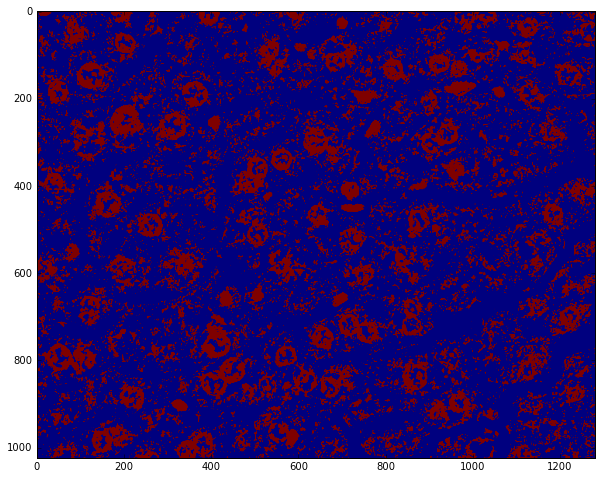

(<matplotlib.image.AxesImage at 0x17789e4d080>, None)

In [48]:
#Threshold using inRange
thresh = cv2.inRange(image, (0,0,0),(255,255,180))

plt.imshow(thresh), plt.show()

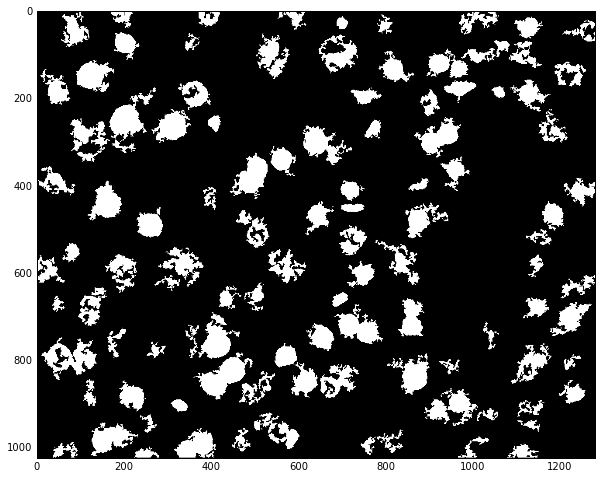

(<matplotlib.image.AxesImage at 0x1778829dfd0>, None)

In [49]:
#Fill in contours and dismiss small background objects
im2, contour,h = cv2.findContours(thresh,cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
t1 = np.zeros(thresh.shape, np.uint8)
for cnt in contour:
    left = tuple(cnt[cnt[:,:,0].argmin()][0])
    right = tuple(cnt[cnt[:,:,0].argmax()][0])
    bottom = tuple(cnt[cnt[:,:,0].argmin()][0])
    top = tuple(cnt[cnt[:,:,0].argmax()][0])
    if cv2.contourArea(cnt) > 400:
        cv2.drawContours(t1,[cnt],0,255,-1) 
#    elif (((left[0] <= 2) and (bottom[1] <= 2) and (right[0] >= thresh.shape[1]-2) and (top[1] >= thresh.shape[0]-2)) == 1):
#        if cv2.contourArea(cnt) > 350:
#            cv2.drawContours(t1, [cnt], 0, 255, -1)
plt.imshow(t1, cmap = 'gray'), plt.show()

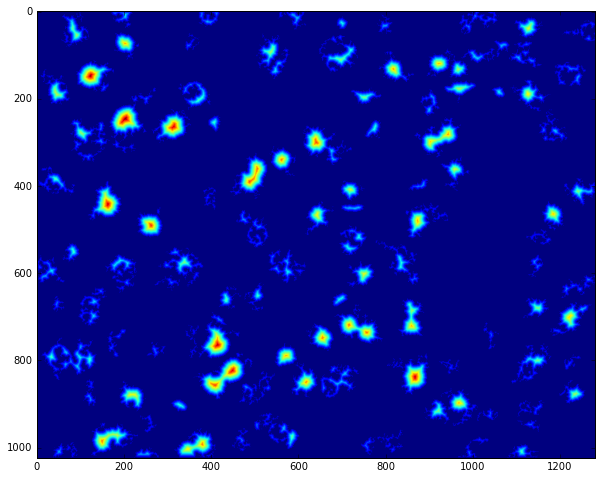

(<matplotlib.image.AxesImage at 0x17789aab550>, None)

In [50]:
#distance transfrom on threshold image
dist = cv2.distanceTransform(t1, cv2.DIST_L2, 5)
#dist = ndimage.distance_transform_edt(t1)
plt.imshow(dist), plt.show()

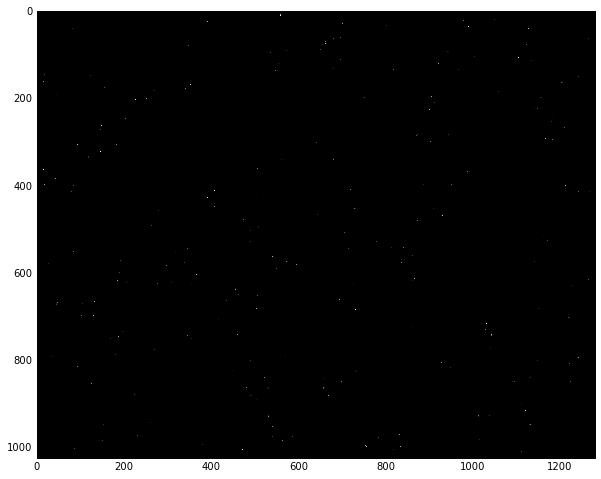

(<matplotlib.image.AxesImage at 0x177899a0a90>, None)

In [51]:
#find local maxima
localMax = peak_local_max(dist, indices=False, min_distance=10, labels=t1)
#print(localMax)
plt.imshow(localMax, cmap = 'gray'), plt.show()

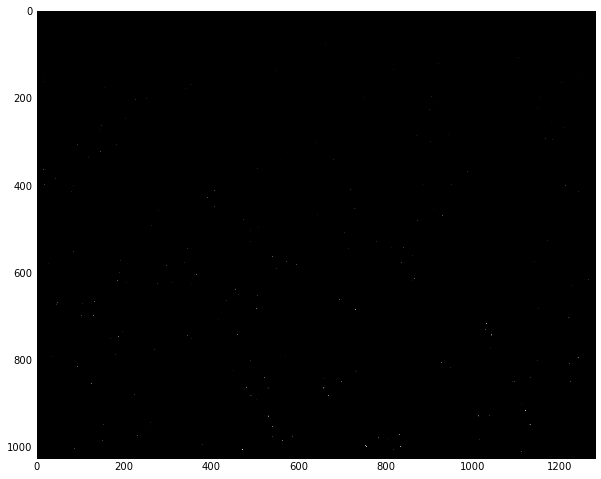

(<matplotlib.image.AxesImage at 0x17789a07e10>, None)

In [52]:
#initialize markers, almost connected components
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
plt.imshow(markers, cmap = 'gray'), plt.show()

[INFO] 356 unique segments found


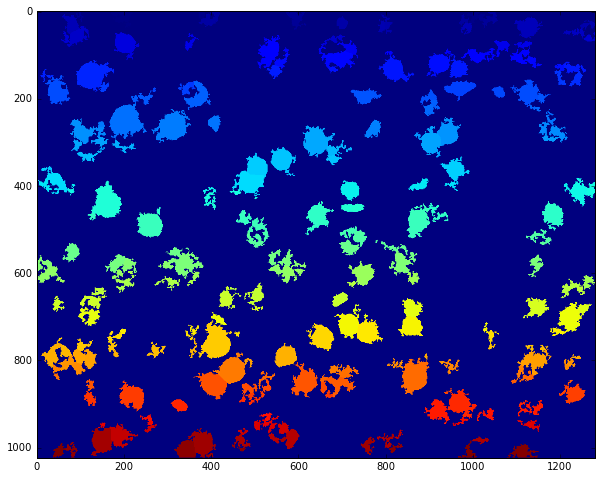

(1024, 1280)


In [53]:
#perform watershed
labels = watershed(-dist, markers, mask=t1)
print("[INFO] {} unique segments found".format(len(np.unique(labels)) - 1))
plt.imshow(labels), plt.show()
print(labels.shape)

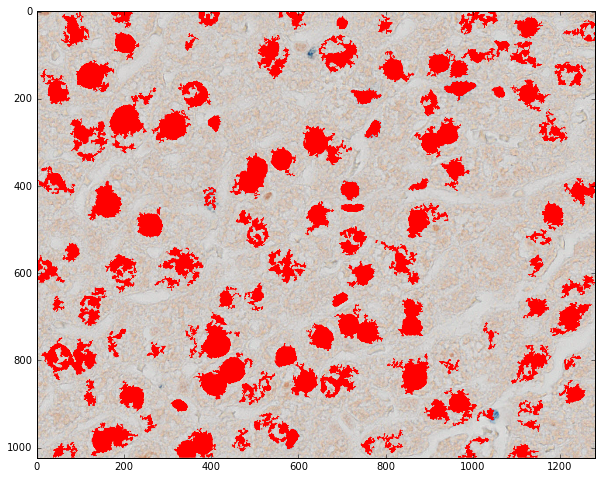

(<matplotlib.image.AxesImage at 0x1778a1d3c50>, None)

In [54]:
for label in np.unique(labels):
    # if the label is zero, we are examining the 'background'
    # so simply ignore it
    if label == 0:
        continue
 
    # otherwise, allocate memory for the label region and draw
    # it on the mask
    mask = np.zeros(dist.shape, dtype="uint8")
    mask[labels == label] = 255
 
    # detect contours in the mask and grab the largest one
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
    cv2.drawContours(image, cnts,0,255,-1)

# show the output image
plt.imshow(image), plt.show()

In [55]:
#----------------TESTING--------------------

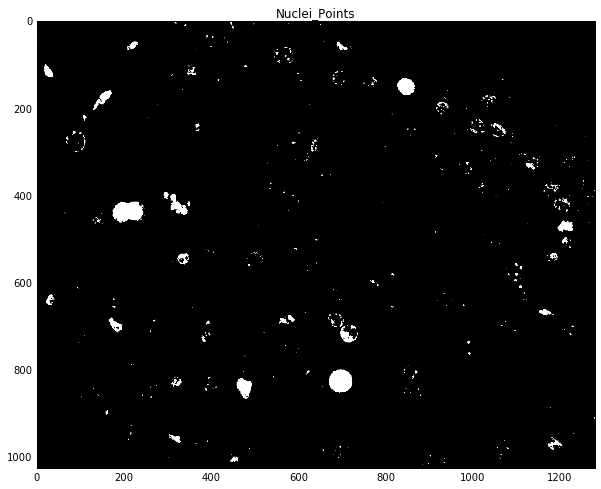

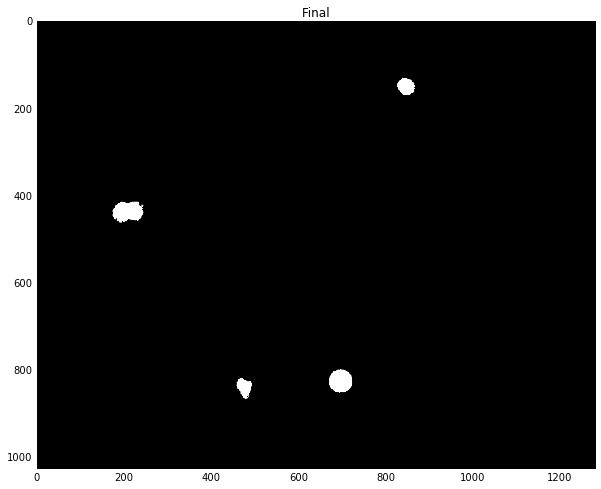

(<matplotlib.image.AxesImage at 0x17789b7e400>,
 None)

In [56]:
img = cv2.imread("Image75.tif")
b,g,r = cv2.split(img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0]-rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

nuclei_points = cv2.inRange(mask, (0, 0, 0), (255, 255, 175))
plt.imshow(nuclei_points, cmap = 'gray'), plt.title("Nuclei_Points"), plt.show()

im2, cnts, h = cv2.findContours(nuclei_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
m = np.zeros(nuclei_points.shape, np.uint8)
a = np.zeros(nuclei_points.shape, np.uint8)
for c in cnts:
    perimeter = cv2.arcLength(c, True)
    if cv2.contourArea(c) >= 1000 and (((4*np.pi*cv2.contourArea(c))/(perimeter*perimeter)) >= 0.37):
        cv2.drawContours(m, [c], 0, 255, -1)
    elif cv2.contourArea(c) > 50:
        cv2.drawContours(a, [c], 0, 255, -1)
plt.imshow(m, cmap = 'gray'), plt.title("Final"), plt.show()

In [57]:
#---------------TESTING TO REMOVE IMMUNE CELLS-----------------------

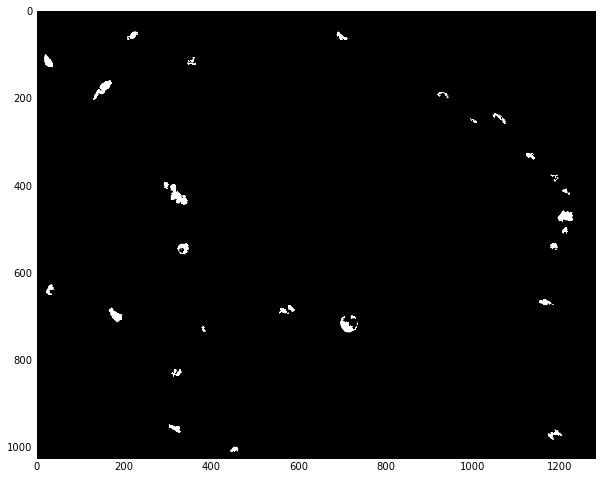

(<matplotlib.image.AxesImage at 0x17789ec2c18>, None)

In [58]:
plt.imshow(a, cmap='gray'), plt.show()

In [59]:
#----TESTING TO REMOVE DARK BLUE IMMUNE CELLS-------------------

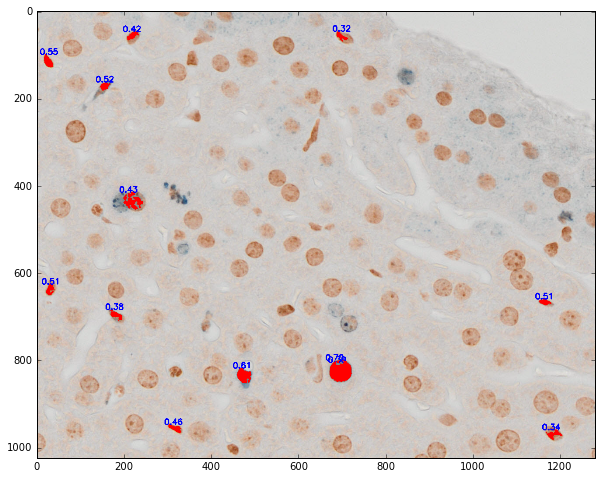

(<matplotlib.image.AxesImage at 0x1778a045898>, None)

In [60]:
immune_img = cv2.imread("Image75.tif")
immune_thresh = cv2.inRange(immune_img, (0, 0, 0), (195, 120, 195))
im2, cnt, h = cv2.findContours(immune_thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
#b = np.zeros(nuclei_points.shape, np.uint8)
for c in cnt:
    area = cv2.contourArea(c)
    if area > 200:
        area = cv2.contourArea(c)
        x,y,w,h = cv2.boundingRect(c)
        rect_area = w*h
        extent = float(area)/rect_area
        cv2.drawContours(immune_img, [c], 0, 255, -1)  
        cv2.putText(immune_img, "{0:.2f}".format(extent), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    
plt.imshow(immune_img, cmap = 'gray'), plt.show()

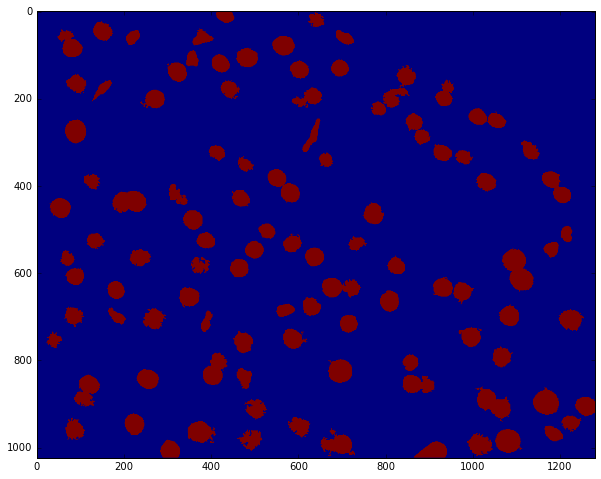

(<matplotlib.image.AxesImage at 0x177882752b0>, None)

In [61]:
i = cv2.imread("Image75.tif")
q1 = np.zeros(dist.shape, np.uint8)
im = cv2.GaussianBlur(i, (0,0), 3)
i = cv2.addWeighted(i, 1.5, im, -0.5, 0)
thresh = cv2.inRange(i, (0,0,0),(255,255,180))
im2, contour,h = cv2.findContours(thresh,cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
t1 = np.zeros(thresh.shape, np.uint8)
for cnt in contour:
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    if area >= 700:
        cv2.drawContours(t1,[cnt],0,255,-1)
dist = cv2.distanceTransform(t1, cv2.DIST_L2, 5)
localMax = peak_local_max(dist, indices=False, min_distance=20, labels=t1)
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-dist, markers, mask=t1)
for label in np.unique(labels):
    if label == 0:
        continue
    mask = np.zeros(dist.shape, dtype="uint8")
    mask[labels == label] = 255
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
    for c in cnts:
        if cv2.contourArea(c) >= 650:
            cv2.drawContours(q1, [c],0,255,-1)
#------------------------PASS 2-----------------------------------------------------
t2 = np.zeros(t1.shape, np.uint8)
a = t1[:] != 0
b = labels[:] != 0
t2[a] = 255
t2[b] = 0
im2, nuclei_contours, h = cv2.findContours(nuclei_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
im2, cnts,h = cv2.findContours(t2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
t3 = np.zeros(t2.shape, np.uint8)
for z in range(len(cnts)):
    for k in range(len(nuclei_contours)):
        for j in range(len(nuclei_contours[k])):
            x = nuclei_contours[k][j][0][0]
            y = nuclei_contours[k][j][0][1]
            points = (x,y)
            num = cv2.pointPolygonTest(cnts[z],points, False)
            if num == 0 or num == 1:
                cv2.drawContours(t3, [cnts[z]], 0, 255, -1)
im2, cnts, h = cv2.findContours(t3, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
hull = []
for c in cnts:
    if cv2.contourArea(c) > 50:
        hull.append(cv2.convexHull(c))
for h in hull:
    cv2.fillConvexPoly(t3, h, 255)
dist = cv2.distanceTransform(t3, cv2.DIST_L2, 5)
localMax = peak_local_max(dist, indices=False, min_distance=10, labels=t3)
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-dist, markers, mask=t3)

for label in np.unique(labels):
    if label == 0:
        continue
    mask = np.zeros(dist.shape, dtype="uint8")
    mask[labels == label] = 255
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
    for c in cnts:
        cv2.drawContours(q1, cnts,0,255,-1)
        
plt.imshow(q1), plt.show()

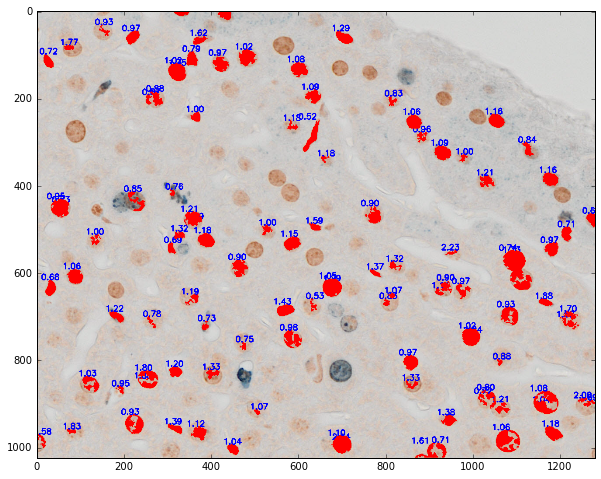

(<matplotlib.image.AxesImage at 0x17782f58400>, None)

In [62]:
img = cv2.imread("Image75.tif")
b,g,r = cv2.split(img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0]-rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

thresh = cv2.inRange(mask, (140, 70, 120), (180, 255, 210))
im2, ct, h = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
q2 = np.zeros(thresh.shape, np.uint8)
for c in ct:
    perimeter = cv2.arcLength(c, True)
    if cv2.contourArea(c) > 100 and (4*np.pi*cv2.contourArea(c))/(perimeter*perimeter) <= 0.8:
        cv2.drawContours(img, [c], 0, 255, -1)
        ((x,y),r) = cv2.minEnclosingCircle(c)
        x,y,w,h = cv2.boundingRect(c)
        aspect_ratio = float(w)/h
        cv2.putText(img, "{0:.2f}".format(aspect_ratio), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
        
plt.imshow(img), plt.show()

In [63]:
#-----TESTING DIFFERENT CONTOUR PROPERTIES ON DARK BLUE---------------

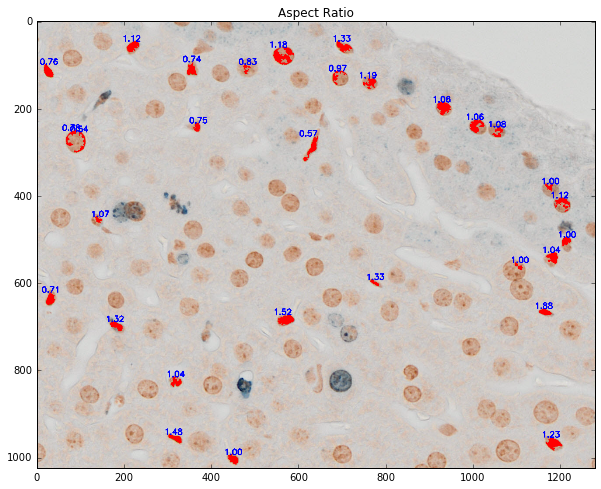

(<matplotlib.image.AxesImage at 0x1778a129470>,
 None)

In [64]:
immune_img = cv2.imread("Image75.tif")
b,g,r = cv2.split(immune_img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0]-rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

immune_thresh = cv2.inRange(mask, (150, 100, 0), (190, 255, 190))
im2, cnt, h = cv2.findContours(immune_thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
#b = np.zeros(nuclei_points.shape, np.uint8)
for c in cnt:
    area = cv2.contourArea(c)
    if area > 100:
        x,y,w,h = cv2.boundingRect(c)
        aspect_ratio = float(w)/h
        cv2.drawContours(immune_img, [c], 0, 255, -1)  
        cv2.putText(immune_img, "{0:.2f}".format(aspect_ratio), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    
plt.imshow(immune_img, cmap = 'gray'), plt.title("Aspect Ratio"), plt.show()

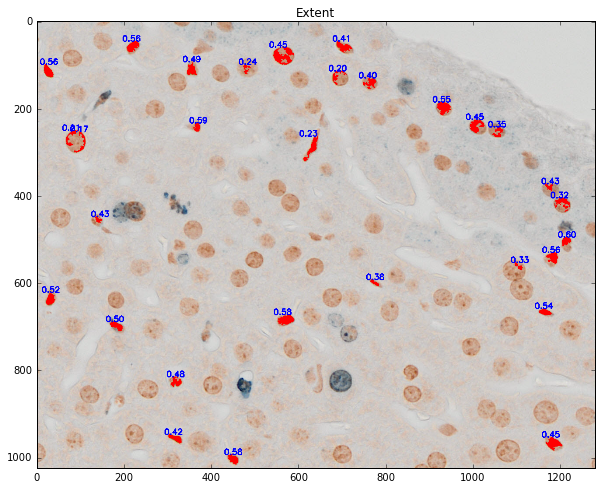

(<matplotlib.image.AxesImage at 0x1778a25d7f0>,
 None)

In [65]:
immune_img = cv2.imread("Image75.tif")
b,g,r = cv2.split(immune_img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0]-rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

immune_thresh = cv2.inRange(mask, (150, 100, 0), (190, 255, 190))
im2, cnt, h = cv2.findContours(immune_thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
#b = np.zeros(nuclei_points.shape, np.uint8)
for c in cnt:
    area = cv2.contourArea(c)
    if area > 100:
        x,y,w,h = cv2.boundingRect(c)
        rect_area = w*h
        extent = float(area)/rect_area
        cv2.drawContours(immune_img, [c], 0, 255, -1)  
        cv2.putText(immune_img, "{0:.2f}".format(extent), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    
plt.imshow(immune_img, cmap = 'gray'), plt.title("Extent"),plt.show()

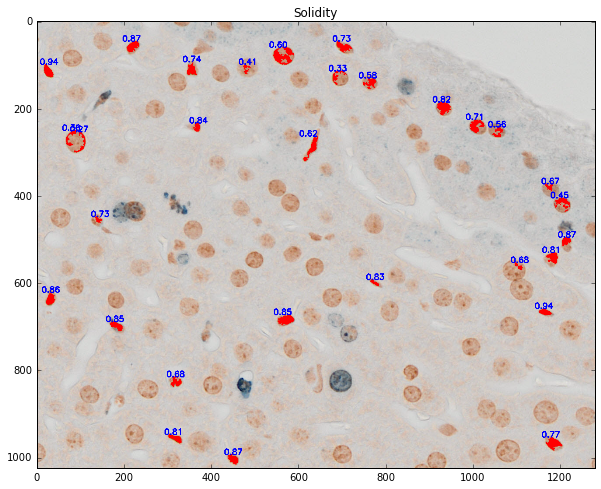

(<matplotlib.image.AxesImage at 0x1778a51cba8>,
 None)

In [66]:
immune_img = cv2.imread("Image75.tif")
b,g,r = cv2.split(immune_img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0]-rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

immune_thresh = cv2.inRange(mask, (150, 100, 0), (190, 255, 190))
im2, cnt, h = cv2.findContours(immune_thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
#b = np.zeros(nuclei_points.shape, np.uint8)
for c in cnt:
    area = cv2.contourArea(c)
    if area > 100:
        x,y,w,h = cv2.boundingRect(c)
        hull = cv2.convexHull(c)
        hull_area = cv2.contourArea(hull)
        solidity = float(area)/hull_area
        cv2.drawContours(immune_img, [c], 0, 255, -1)  
        cv2.putText(immune_img, "{0:.2f}".format(solidity), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    
plt.imshow(immune_img, cmap = 'gray'), plt.title("Solidity"),plt.show()

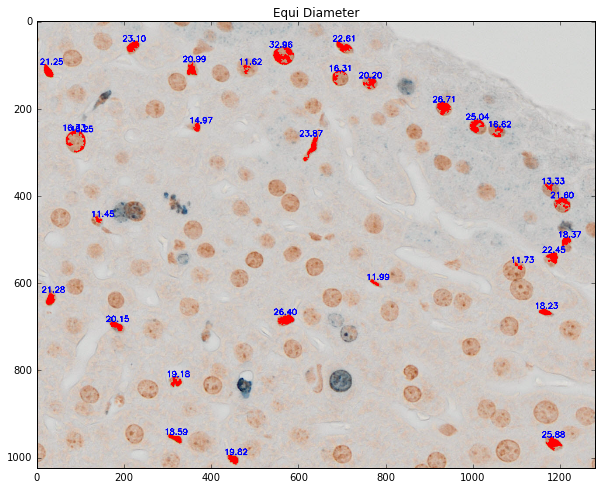

(<matplotlib.image.AxesImage at 0x17789992940>,
 None)

In [67]:
immune_img = cv2.imread("Image75.tif")
b,g,r = cv2.split(immune_img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0]-rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

immune_thresh = cv2.inRange(mask, (150, 100, 0), (190, 255, 190))
im2, cnt, h = cv2.findContours(immune_thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
#b = np.zeros(nuclei_points.shape, np.uint8)
for c in cnt:
    area = cv2.contourArea(c)
    if area > 100:
        x,y,w,h = cv2.boundingRect(c)
        equi_diameter = np.sqrt(4*area/np.pi)
        cv2.drawContours(immune_img, [c], 0, 255, -1)  
        cv2.putText(immune_img, "{0:.2f}".format(equi_diameter), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    
plt.imshow(immune_img, cmap = 'gray'), plt.title("Equi Diameter"), plt.show()

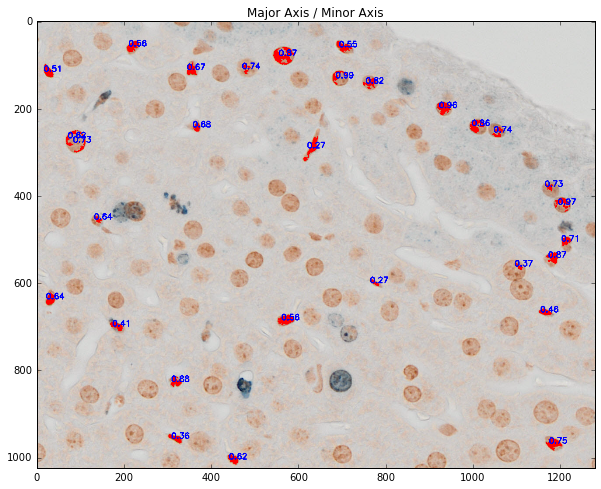

(<matplotlib.image.AxesImage at 0x17789cec8d0>,
 None)

In [68]:
immune_img = cv2.imread("Image75.tif")
b,g,r = cv2.split(immune_img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0]-rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

immune_thresh = cv2.inRange(mask, (150, 100, 0), (190, 255, 190))
im2, cnt, h = cv2.findContours(immune_thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
#b = np.zeros(nuclei_points.shape, np.uint8)
for c in cnt:
    area = cv2.contourArea(c)
    if area > 100:
        (x,y),(MA,ma),angle = cv2.fitEllipse(c)
        cv2.drawContours(immune_img, [c], 0, 255, -1)  
        cv2.putText(immune_img, "{0:.2f}".format((MA/ma)), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    
plt.imshow(immune_img, cmap = 'gray'), plt.title("Major Axis / Minor Axis"), plt.show()

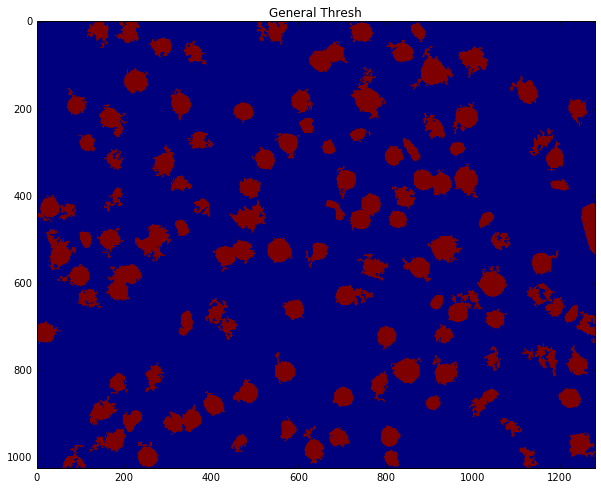

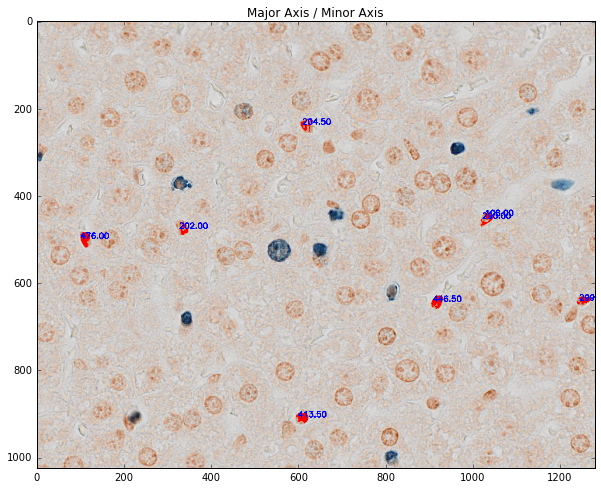

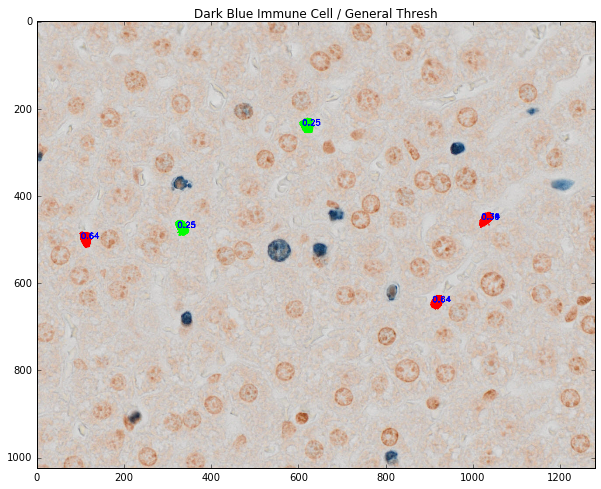

(<matplotlib.image.AxesImage at 0x17788c1a780>,
 None)

In [69]:
i = cv2.imread("Image2.tif")
q1 = np.zeros(dist.shape, np.uint8)
im = cv2.GaussianBlur(i, (0,0), 3)
i = cv2.addWeighted(i, 1.5, im, -0.5, 0)
thresh = cv2.inRange(i, (0,0,0),(255,255,180))
im2, contour,h = cv2.findContours(thresh,cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
t1 = np.zeros(thresh.shape, np.uint8)
for cnt in contour:
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    if area >= 700:
        cv2.drawContours(t1,[cnt],0,255,-1)
dist = cv2.distanceTransform(t1, cv2.DIST_L2, 5)
localMax = peak_local_max(dist, indices=False, min_distance=20, labels=t1)
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-dist, markers, mask=t1)
for label in np.unique(labels):
    if label == 0:
        continue
    mask = np.zeros(dist.shape, dtype="uint8")
    mask[labels == label] = 255
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
    for c in cnts:
        if cv2.contourArea(c) >= 650:
            cv2.drawContours(q1, [c],0,255,-1)
#------------------------PASS 2-----------------------------------------------------
t2 = np.zeros(t1.shape, np.uint8)
a = t1[:] != 0
b = labels[:] != 0
t2[a] = 255
t2[b] = 0
im2, nuclei_contours, h = cv2.findContours(nuclei_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
im2, cnts,h = cv2.findContours(t2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
t3 = np.zeros(t2.shape, np.uint8)
for z in range(len(cnts)):
    for k in range(len(nuclei_contours)):
        for j in range(len(nuclei_contours[k])):
            x = nuclei_contours[k][j][0][0]
            y = nuclei_contours[k][j][0][1]
            points = (x,y)
            num = cv2.pointPolygonTest(cnts[z],points, False)
            if num == 0 or num == 1:
                cv2.drawContours(t3, [cnts[z]], 0, 255, -1)
im2, cnts, h = cv2.findContours(t3, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
hull = []
for c in cnts:
    if cv2.contourArea(c) > 50:
        hull.append(cv2.convexHull(c))
for h in hull:
    cv2.fillConvexPoly(t3, h, 255)
dist = cv2.distanceTransform(t3, cv2.DIST_L2, 5)
localMax = peak_local_max(dist, indices=False, min_distance=10, labels=t3)
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-dist, markers, mask=t3)

for label in np.unique(labels):
    if label == 0:
        continue
    mask = np.zeros(dist.shape, dtype="uint8")
    mask[labels == label] = 255
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
    for c in cnts:
        cv2.drawContours(q1, cnts,0,255,-1)
        
plt.imshow(q1), plt.title("General Thresh"), plt.show()
#-----------------------CREATING DARK BLUE IMMUNE CELL MASK-----------------------------
immune_img = i
b,g,r = cv2.split(immune_img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0]-rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

immune_thresh = cv2.inRange(mask, (150, 100, 0), (190, 255, 190))
im2, cnt, h = cv2.findContours(immune_thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
#b = np.zeros(nuclei_points.shape, np.uint8)
blue_cnt = []
for c in cnt:
    area = cv2.contourArea(c)
    if area > 100:
        blue_cnt.append(c)
        (x,y),(MA,ma),angle = cv2.fitEllipse(c)
        cv2.drawContours(immune_img, [c], 0, 255, -1)  
        cv2.putText(immune_img, "{0:.2f}".format(area), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    
plt.imshow(immune_img, cmap = 'gray'), plt.title("Major Axis / Minor Axis"), plt.show()
#--------------------Dark Blue Immune Cell / General Thresh --------------------------
imag = cv2.imread('Image2.tif')
im2, gen_cnt, h = cv2.findContours(q1, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
for z in range(len(gen_cnt)):
    for k in range(len(blue_cnt)):
        for j in range(len(blue_cnt[k])):
            x = blue_cnt[k][j][0][0]
            y = blue_cnt[k][j][0][1]
            pnt = (x,y)
            num = cv2.pointPolygonTest(gen_cnt[z],pnt, False)
            if (num == 0 or num == 1) and cv2.contourArea(gen_cnt[z]) > 100:
                if float(cv2.contourArea(blue_cnt[k]))/cv2.contourArea(gen_cnt[z]) < 0.35:
                    cv2.drawContours(imag, [gen_cnt[z]],0,(0,255,0),-1)
                else:
                    cv2.drawContours(imag, [gen_cnt[z]], 0, 255, -1)
                (x,y), (MA, ma), angle = cv2.fitEllipse(gen_cnt[z])
                cv2.putText(imag, "{0:.2f}".format(float(cv2.contourArea(blue_cnt[k]))/cv2.contourArea(gen_cnt[z])), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
                
plt.imshow(imag), plt.title("Dark Blue Immune Cell / General Thresh"), plt.show()

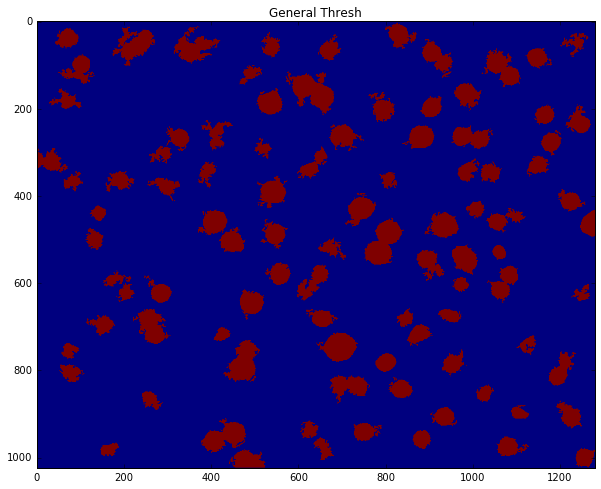

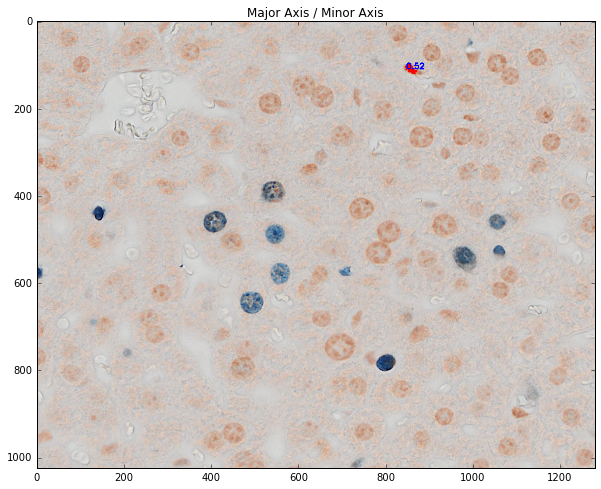

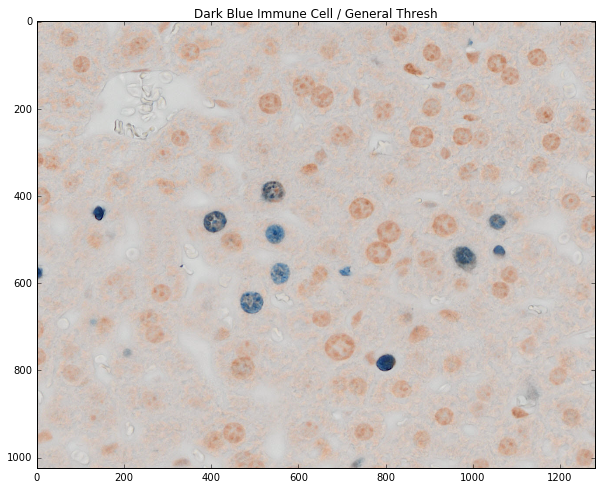

(<matplotlib.image.AxesImage at 0x17789dc6da0>,
 None)

In [70]:
i = cv2.imread("Image73.tif")
q1 = np.zeros(dist.shape, np.uint8)
im = cv2.GaussianBlur(i, (0,0), 3)
i = cv2.addWeighted(i, 1.5, im, -0.5, 0)
thresh = cv2.inRange(i, (0,0,0),(255,255,180))
im2, contour,h = cv2.findContours(thresh,cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
t1 = np.zeros(thresh.shape, np.uint8)
for cnt in contour:
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    if area >= 700:
        cv2.drawContours(t1,[cnt],0,255,-1)
dist = cv2.distanceTransform(t1, cv2.DIST_L2, 5)
localMax = peak_local_max(dist, indices=False, min_distance=20, labels=t1)
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-dist, markers, mask=t1)
for label in np.unique(labels):
    if label == 0:
        continue
    mask = np.zeros(dist.shape, dtype="uint8")
    mask[labels == label] = 255
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
    for c in cnts:
        if cv2.contourArea(c) >= 650:
            cv2.drawContours(q1, [c],0,255,-1)
#------------------------PASS 2-----------------------------------------------------
t2 = np.zeros(t1.shape, np.uint8)
a = t1[:] != 0
b = labels[:] != 0
t2[a] = 255
t2[b] = 0
im2, nuclei_contours, h = cv2.findContours(nuclei_points, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
im2, cnts,h = cv2.findContours(t2, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
t3 = np.zeros(t2.shape, np.uint8)
for z in range(len(cnts)):
    for k in range(len(nuclei_contours)):
        for j in range(len(nuclei_contours[k])):
            x = nuclei_contours[k][j][0][0]
            y = nuclei_contours[k][j][0][1]
            points = (x,y)
            num = cv2.pointPolygonTest(cnts[z],points, False)
            if num == 0 or num == 1:
                cv2.drawContours(t3, [cnts[z]], 0, 255, -1)
im2, cnts, h = cv2.findContours(t3, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
hull = []
for c in cnts:
    if cv2.contourArea(c) > 50:
        hull.append(cv2.convexHull(c))
for h in hull:
    cv2.fillConvexPoly(t3, h, 255)
dist = cv2.distanceTransform(t3, cv2.DIST_L2, 5)
localMax = peak_local_max(dist, indices=False, min_distance=10, labels=t3)
markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
labels = watershed(-dist, markers, mask=t3)

for label in np.unique(labels):
    if label == 0:
        continue
    mask = np.zeros(dist.shape, dtype="uint8")
    mask[labels == label] = 255
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
    for c in cnts:
        cv2.drawContours(q1, cnts,0,255,-1)
        
plt.imshow(q1), plt.title("General Thresh"), plt.show()
#-----------------------CREATING DARK BLUE IMMUNE CELL MASK-----------------------------
immune_img = i
b,g,r = cv2.split(immune_img)
rgb_img = cv2.merge([r,g,b])
rg = cv2.merge([r,g,b])
rg = rg.astype(np.float32)

np.seterr(all = 'ignore')
mask = np.empty_like(rg)
arr_max = rg.max(-1)
delta = rg.ptp(-1)
s = delta/arr_max
s[delta==0]=0
idx = (rg[:,:,0] == arr_max)
mask[idx,0] = np.true_divide((rg[idx,1] - rg[idx,2]), delta[idx])
idx = (rg[:,:,1] == arr_max)
mask[idx,0] = 2. + np.true_divide((rg[idx,2] - rg[idx,0]), delta[idx])
idx = (rg[:,:,2] == arr_max)
mask[idx,0] = 4. + np.true_divide((rg[idx,0]-rg[idx,1]), delta[idx])
mask[:,:,0] = ((mask[:,:,0]/6.0)%1.0)*255.0
mask[:,:,0] = np.nan_to_num(mask[:,:,0])
mask[:,:,1] = s * 255.0
mask[:,:,2] = arr_max
mask = mask.astype(np.uint8)

immune_thresh = cv2.inRange(mask, (150, 100, 0), (190, 255,190))
im2, cnt, h = cv2.findContours(immune_thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
#b = np.zeros(nuclei_points.shape, np.uint8)
blue_cnt = []
for c in cnt:
    area = cv2.contourArea(c)
    if area > 100:
        blue_cnt.append(c)
        (x,y),(MA,ma),angle = cv2.fitEllipse(c)
        cv2.drawContours(immune_img, [c], 0, 255, -1)  
        cv2.putText(immune_img, "{0:.2f}".format(MA/ma), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
    
plt.imshow(immune_img, cmap = 'gray'), plt.title("Major Axis / Minor Axis"), plt.show()
#--------------------Dark Blue Immune Cell / General Thresh --------------------------
imag = cv2.imread('Image73.tif')
im2, gen_cnt, h = cv2.findContours(q1, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
text_file = open("Output.txt", "w")
#print("Contour #\tBlue/General Thresh\tArea\tAspect Ratio\tExtent\tSolidity\tMajor/Minor Axis")
#text_file.write("Contour #\tBlue/General Thresh\tArea\tAspect Ratio\tExtent\tSolidity\tMajor/Minor Axis")
v = []
for z in range(len(gen_cnt)):
    for k in range(len(blue_cnt)):
        for j in range(len(blue_cnt[k])):
            x = blue_cnt[k][j][0][0]
            y = blue_cnt[k][j][0][1]
            pnt = (x,y)
            num = cv2.pointPolygonTest(gen_cnt[z],pnt, False) 
            area = cv2.contourArea(gen_cnt[z])               
            hull = cv2.convexHull(gen_cnt[z])
            hull_area = cv2.contourArea(hull)
            solidity = float(area)/hull_area
            (x,y), (MA, ma), angle = cv2.fitEllipse(gen_cnt[z])               
            x,y,w,h = cv2.boundingRect(gen_cnt[z])
            aspect_ratio = float(w)/h
            rect_area = w*h
            extent = float(area)/rect_area
            if (num == 0 or num == 1) and cv2.contourArea(gen_cnt[z]) > 100:
                if float(cv2.contourArea(blue_cnt[k]))/cv2.contourArea(gen_cnt[z]) <= 0.35 or area > 1050:
                    cv2.drawContours(imag, [gen_cnt[z]],0,(0,255,0),-1)
                else:
                    cv2.drawContours(imag, [gen_cnt[z]],0, 255, -1)
                cv2.putText(imag, "{0:.2f}".format(float(k)), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
                if k not in v:
                    v.append(k)
                    #print(k,"\t","{0:.2f}".format(float(cv2.contourArea(blue_cnt[k]))/cv2.contourArea(gen_cnt[z])),"\t",area,"\t","{0:.2f}".format(aspect_ratio),"\t","{0:.2f}".format(extent),"\t","{0:.2f}".format(solidity),"\t","{0:.2f}".format(MA/ma))
                    #text_file.write(str(k)+"\t"+"{0:.2f}".format(float(cv2.contourArea(blue_cnt[k]))/cv2.contourArea(gen_cnt[z]))+"\t"+str(area)+"\t"+"{0:.2f}".format(aspect_ratio)+"\t"+"{0:.2f}".format(extent)+"\t"+"{0:.2f}".format(solidity)+"\t"+"{0:.2f}".format(MA/ma))
plt.imshow(imag), plt.title("Dark Blue Immune Cell / General Thresh"), plt.show()
#text_file.close()

In [71]:
#-----------------DENSITY PLOT/ CUMULATIVE DENSITY PLOT-------------------------------

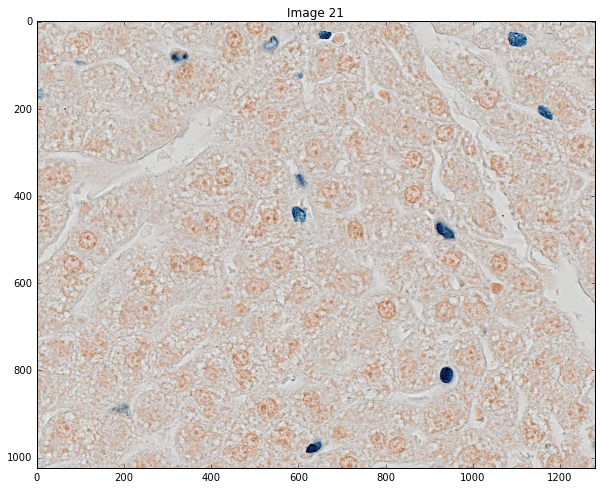

9558


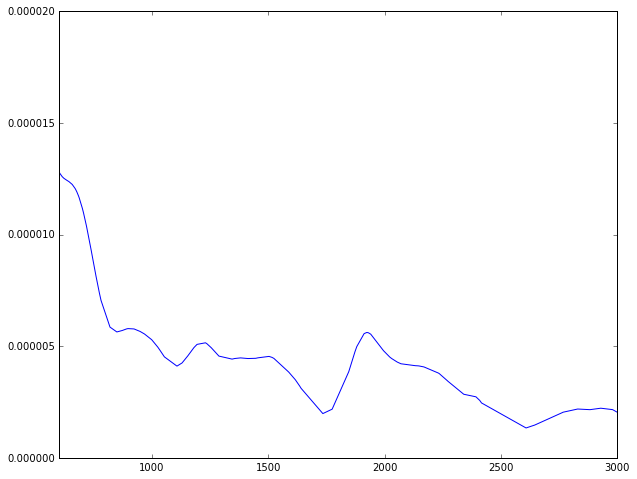

In [72]:
from scipy.stats import gaussian_kde

img = cv2.imread("Dropbox/BrdUImgs/Image (41).tif")
i = cv2.GaussianBlur(img, (0,0), 3)
img = cv2.addWeighted(img, 1.5, i, -0.5, 0)

plt.imshow(img), plt.title("Image 21"), plt.show()

thresh = cv2.inRange(img, (0,0,0), (255,255, 185))
_,cnt,_ = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

data = []
for c in cnt:
    area = cv2.contourArea(c)
    data.append(area)

data = sorted(data)    
print(len(data))
density = gaussian_kde(data)
#xs = np.linspace(0,8,200)
#print(len(xs))
#density.covariance_factor = lambda : .25
#density._compute_covariance()
plt.plot(data,density(data))
plt.xlim(600, 3000)
plt.ylim(0,0.00002)
plt.show()

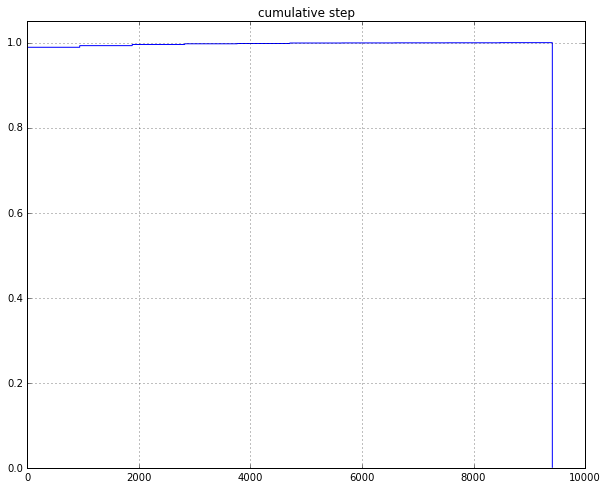

In [73]:
n, bins, patches = plt.hist(data, normed=1,
                            histtype='step', cumulative=True)
plt.grid(True)
plt.ylim(0, 1.05)
plt.title('cumulative step')

plt.show()

In [74]:
#------------- FOURIER -------------------

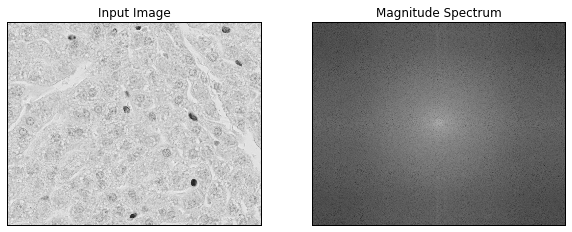

In [75]:
img = cv2.imread('Dropbox/BrdUImgs/Image (41).tif',0)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

C:\Users\Dasha\Anaconda3\lib\site-packages\ipykernel\__main__.py:3: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


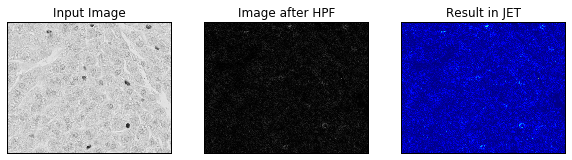

In [76]:
rows, cols = img.shape
crow,ccol = rows/2 , cols/2
fshift[crow-30:crow+30, ccol-30:ccol+30] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.subplot(131),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])

plt.show()

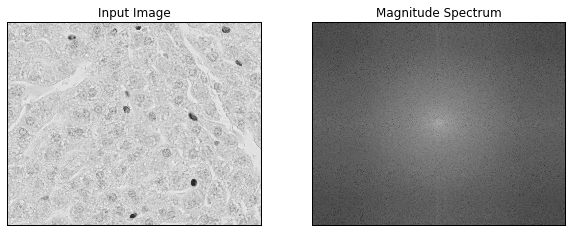

In [77]:
img = cv2.imread('Dropbox/BrdUImgs/Image (41).tif',0)

dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1]))

plt.subplot(121),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

C:\Users\Dasha\Anaconda3\lib\site-packages\ipykernel\__main__.py:6: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


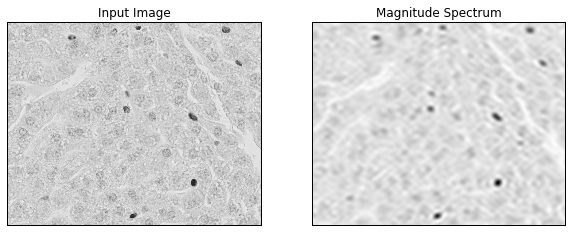

In [78]:
rows, cols = img.shape
crow,ccol = rows/2 , cols/2

# create a mask first, center square is 1, remaining all zeros
mask = np.zeros((rows,cols,2),np.uint8)
mask[crow-30:crow+30, ccol-30:ccol+30] = 1

# apply mask and inverse DFT
fshift = dft_shift*mask
f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

plt.subplot(121),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img_back, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()